<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Exam-1" data-toc-modified-id="Exam-1-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Exam 1</a></span></li><li><span><a href="#Problem-1" data-toc-modified-id="Problem-1-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Problem 1</a></span><ul class="toc-item"><li><span><a href="#Controller-Design" data-toc-modified-id="Controller-Design-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Controller Design</a></span></li><li><span><a href="#Controller-Validation" data-toc-modified-id="Controller-Validation-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Controller Validation</a></span></li></ul></li><li><span><a href="#Problem-2" data-toc-modified-id="Problem-2-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Problem 2</a></span><ul class="toc-item"><li><span><a href="#Model-Scoping" data-toc-modified-id="Model-Scoping-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Model Scoping</a></span></li><li><span><a href="#Model-Construction" data-toc-modified-id="Model-Construction-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Model Construction</a></span></li><li><span><a href="#Model-Construction:-Find-a-suitable-value-for-the-damping-in-the-motor-and-bearings" data-toc-modified-id="Model-Construction:-Find-a-suitable-value-for-the-damping-in-the-motor-and-bearings-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Model Construction: Find a suitable value for the damping in the motor and bearings</a></span></li><li><span><a href="#Model-Evaluation" data-toc-modified-id="Model-Evaluation-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Model Evaluation</a></span></li></ul></li><li><span><a href="#Problem-3" data-toc-modified-id="Problem-3-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Problem 3</a></span><ul class="toc-item"><li><span><a href="#Controller-Design" data-toc-modified-id="Controller-Design-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Controller Design</a></span></li><li><span><a href="#Controller-Validation" data-toc-modified-id="Controller-Validation-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Controller Validation</a></span></li><li><span><a href="#Controller-Evaluation" data-toc-modified-id="Controller-Evaluation-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Controller Evaluation</a></span></li></ul></li></ul></div>

# Exam 1

In order to submit this exam in ME480 you are required to acknowledge your compliance with these academic honesty requirements by signing the statement below.
 
* Professor Brown and/or Professor Sabatino are the only people you are able to ask questions regarding the information on the exam.
* Consultation or collaboration with anyone else **are not permissible on take home exams.**  
* You **ARE allowed to** consult your Jupyter notebooks, class notes, or other reference material.
* You many NOT consult any person other than your instructors about any aspect of this exam.

**By typing your full name below, you acknowledge the following:** 

I affirm that I have had no conversation regarding this exam with any persons other than the instructors. Further, I certify that the attached work represents my own thinking. Any information, concepts, or words that originate from other sources are cited in accordance with Lafayette College guidelines as published in the Student Handbook. I am aware of the serious consequences that result from improper discussions with others or from the improper citation of work that is not my own.

**Type your full name in the cell below to serve as an electronic signature**

Sage Herz


<div><font size = 5><center>Insert one image per cell.</center></font>

<div><font size = 5><center>You can add Markdown cells if you need to add images.</center></font>

<div><font size = 5 color = "red"><center>DO NOT DELETE OR SPLIT CELLS</center></font>

***

# Problem 1

At the Crayola factory in Easton, there are a number of activities for young children that include both art and technology like the one shown below.  Crayola has a new concept for a "Spirograph machine" that they want to build and are asking for help in designing the control system.

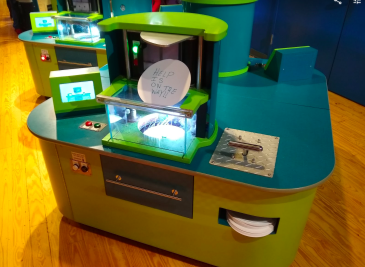

Your task in this exam is to design the controller for this new machine!

The machine will consist of a turntable and a stylus. When the turntable is raised and rotated, the stylus holds a pen on the turntable and oscillates back and forth to create fun patterns on a piece of paper. Like any machine with large rotating parts, it requires a safety system, which you will implement as a finite state machine. The design requirements for the first iteration of the state machine are shown.  Although the machine has capability that will be added later, design a control system for just the sepcifications below.

1. The machine will start with all motors off, the turntable in the lowered position and the **STOP (light)** illuminated.
2. If the **E-Stop Button** is not latched down, when the **Start Button** is pressed the **STOP (light)** is turned off, the the green **RUNNING (light)** is illuminated, and the turntable is raised. 
3. Under no circumstances should the turntable or the stylus move unless the turntable is raised.
3. The **RUNNING (light)** indicator should be on any time the turntable is raised, and off any time it is not.
3. If a unique button press of the **Speed Button** is not detected within 2 seconds, the **RUNNING (light)** is turned off, the turntable is lowered, and the  **STOP (light)** is illuminated.
4. If a unique button press of the **Speed Button** IS detected within 2 seconds of the **Start Button** being pressed, the turntable will rotate in forward speed, the **FWD (light)** will be illuminated, and the stylus will oscillate.
5. If the **E-Stop Button** or the **Speed Button** is not pressed for 4 seconds after the turntable starts moving, the system will return to the previous state where the **RUNNING (light)** is illuminated, the turntable is raised, but the motors are stopped. After that, the user has 2 seconds to press the speed button or else the **RUNNING (light)** is turned off, the turntable is lowered, and the **STOP (light)** illuminated.
6. While the the turntable is rotating forward, a unique press of the **Speed Button** will immediately return the machine to the previous state where the **RUNNING (light)** is illuminated, the turntable is raised, but the motors are stopped. 
7. If at any time the **E-Stop Button** is pressed, all motors will stop, the turntable will be lowered, and the  **STOP (light)** will be illuminated.  The system will not leave this state while the **E-Stop Button** is latched down.


A simulation of the machine as delivered from the design department is presented below. As with the simulators we have provided in the past, intermediate variables V1-V21 are global and available for use as you design your FSM. Other relevant variables are explained below.

| Name | Description |
|:----:|:-----------:|
| SP0  | True on first loop only|
| ES   | E-Stop Button |
| ST   | Start Button |
| SPD  | Speed Button|
| YRUNNING | Running light|
| YSTOP    | Stop light |
| UP | Raises turntable if true.  If false, turntable is down |
| FWD | Turns turntable forward |
| OSC | Oscillates stylus if true |

| Name | Description |
|:----:|:-----------:|
| T0_EN,T0,TA0,T0_DUR | Timer 0 variables - described below timer on simulator |
| T1_EN,T1,TA1,T1_DUR | Timer 1 variables - described below timer on simulator|
| CT0_UP,CT0_DN,CT0,CT0_RST,CTA0,CT0_CNT | Counter 0 variables - described below counter on simulator |


In [1]:
%%html
<iframe id="inlineFrameExample" title="Inline Frame Example" width="1000" height="1000" src="https://workbench.lafayette.edu/~brownaa/ME480/spirosim/spirosim.html"> </iframe>

## Controller Design

In the markdown cell below, design an FSM using a properly labeled and formatted state transition diagram with an accompanying state transition table and variable key. You may add extra markdown cells **below** the one provided if you need to attach multiple images (one cell per image).

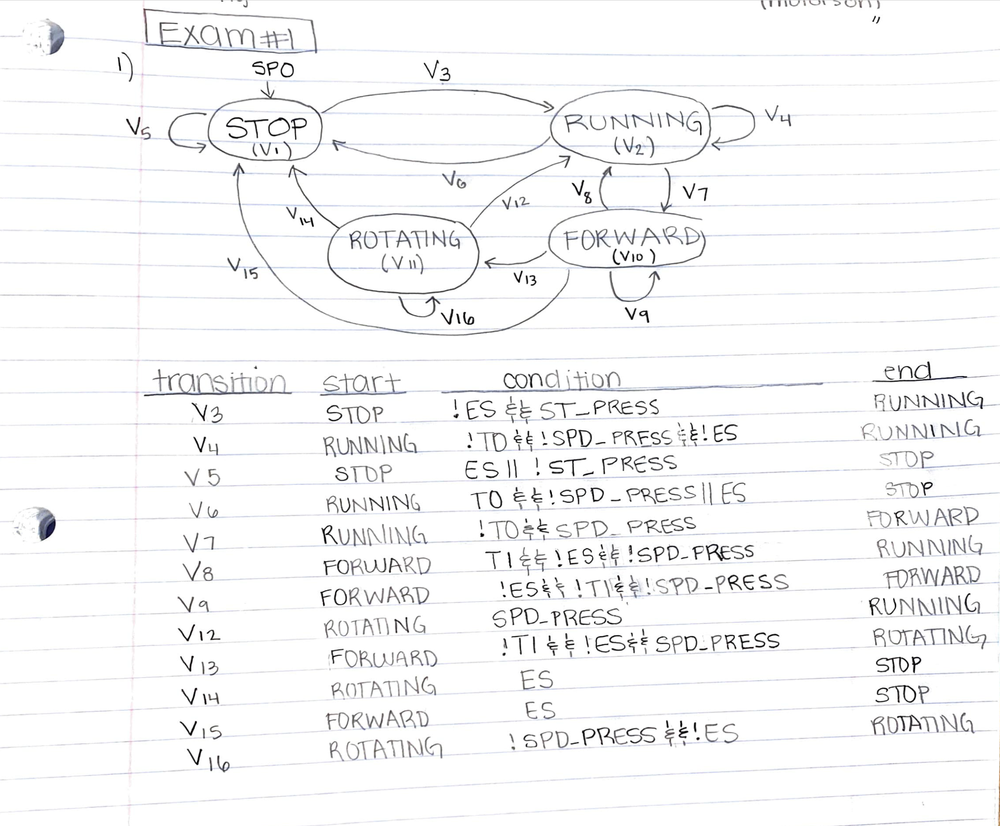

## Controller Validation

In the markdown cell, place a working, commented FSM program that could be run in the simulator. **The code does not have to be perfect to earn a good score**, but you should present a properly formatted, complete piece of code in the markdown cell below for full credit. You may use the simulator as a self-evaluation tool, but it is not required. The process and structure you use to arrive at your final answer are most important. 

BE SURE TO INCLUDE \`\`\` BEFORE AND AFTER YOUR CODE SO IT CAN BE EASILY READ

```javascript
//ST_PRESS represents a unique press of the start button
//SPD_PRESS represents a unique press of the speed button
//ST_OLD represents the old state of the start button
//SPD_OLD represents the old state of the speed button

//V1 represents the STOP state where the STOP light is illuminated, the table is lowered, and the motors are off
//V2 represents the RUNNING state where the RUNNING light is illuminated, the table is raised, and the motors are off
//V10 represents the ROTATING state where the FWD light is on, the stylus is oscillating, and the turn table is rotating
//V11 represents the FORWARD state where the FWD light is on, the stylus is oscillating, and the turn table is rotating

//V3 represents the transition from STOP to RUNNING
//V4 represents the latch on the RUNNING state
//V5 represents the latch on the STOP state
//V6 represents the transition from RUNNING to STOP
//V7 represents the transition from RUNNING to FORWARD
//V8 represents the transition from FORWARD to STOP
//V9 represents the latch on the FORWARD state
//V12 represents the transition from ROTATING to RUNNING
//V13 represents the transition from FORWARD to ROTATING
//V14 represents the transition from ROTATING to STOP
//V15 represents the transition from FORWARD to STOP
//V16 represents the latch on the ROTATING state
//BLOCK 1
ST_PRESS = ST&&ST_OLD;
SPD_PRESS = SPD&&SPD_OLD;

//timer0...
T0_DUR = 2000; //Timer 0 duration in milliseconds
T0_EN = V2;
Y1 = T0;

//timer 1...
T1_DUR = 4000; //Timer 0 duration in milliseconds
T1_EN = V10;
Y2 = T1;      

//BLOCK 2
V3 = V1&&!ES&&ST_PRESS;
V4 = V2&&!T0&&!SPD_PRESS&&!ES;
V5 = V1&&ES||V1&&!ST_PRESS;
V6 = V2&&T0&&!SPD_PRESS||V2&&ES;
V7 = V2&&!T0&&SPD_PRESS;
V8 = V10&&T1&&!ES&&!SPD_PRESS;
V9 = V10&&!ES&&!T1&&!SPD_PRESS;
V12 = V11&&SPD_PRESS;
V13 = V10&&!T1&&!ES&&SPD_PRESS;
V14 = V11&&ES;
V15 = V10&&ES;
V16 = V11&&!SPD_PRESS&&!ES;

//BLOCK 3
V1 = SP0||V5||V6||V14||V15;
V2 = V3||V4||V8||V12;
V10 = V7||V9;
V11 = V13||V16;

//BLOCK 4
YSTOP = V1;
YRUNNING = V2;
UP = V2||V10||V11;
FWD = V10||V11;
OSC = V10||V11;

ST_OLD = ST;
SPD_OLD = SPD;
```

# Problem 2

The heart of the spirograph is the turntable.  Your company's design team delivered a unit to your controls division where you work.  The motor they provided has the following known properties:

* Motor and gearbox inertia $J_m = 1.0x10^{-3} kgm^2$
* Motor constant $k_t = .8731 \frac{Nm}{A}$
* Motor armature resistance $R= 2.18\Omega$
* Turntable mass $m=2kg$
* Turntable radius $r = 0.3m$

The turntable is attached directly to the motor's output shaft, and glides in bearings attached to the base of the unit for extra support. The characteristics of those bearings and those in the motor are both unknown.  The whole turntable unit moves up and down under the influence of a separate system, which we will not consider here. 

A simplified representation of the turntable is shown in the image below.

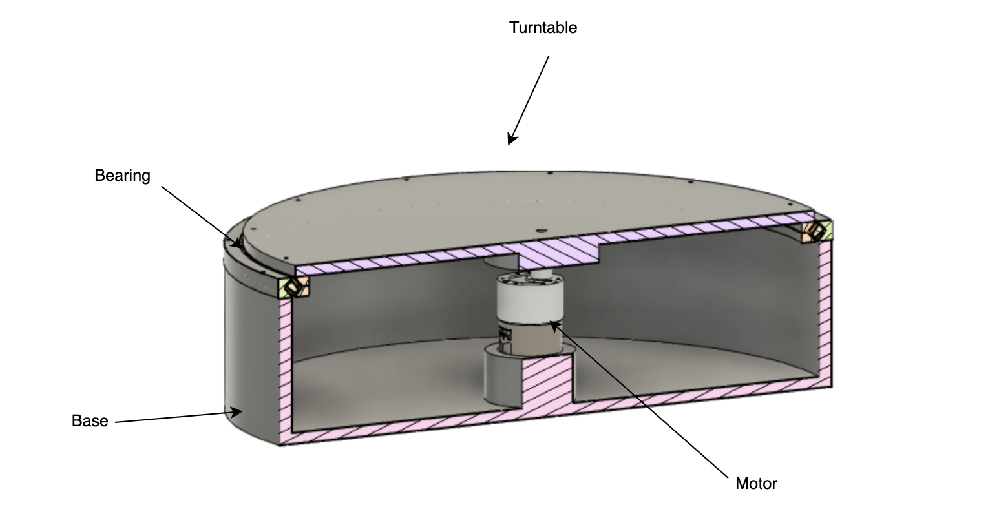

You suspect that you may have to iterate on the turntable's design, so you commit to building a *physics-based* lumped parameter model of the motor-turntable system so that you can predict effects of changing the turntable mass and/or radius in future iterations of this design. 

You perform two open-loop step response tests on the turntable system, and obtain the following datasets. These datasets are also available in this assignment's folder under the names `step1data.txt` and `step2data.txt`. In both cases, the columns in the data file are `[time (seconds), Vin (Volts), Turntable Speed (rad/s)]`.

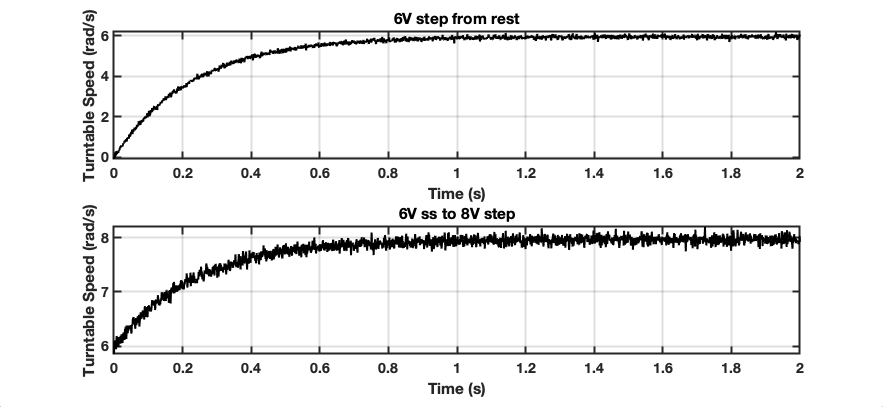

## Model Scoping

Using one or both of experiments above as appropriate, scope a model of the system including explicit delineation of and justification for input, output, order, and each lumped-parameter element you will include in your model.

According to the data, the system appears first order. This means there is only ONE independent, energy-storing element. Although we have two energy storing elements (the turntable's mass and the rotational inertia of the motor), they are not independent and the turntable's mass can be lumped into the rotational inertia of the motor as we know both the mass and radius. These two elements can be lumped together as they both rotate at the same speed ($\Omega$). The input for the system is the supplied voltage to the motor ($V_s$) and the output is the angular speed of the turntable ($\Omega$). Therefore, the elements in the system model are the lumped rotational inertia from the turntable's mass and the motor (J), the motor armature resistance (R), and some damping in the motor and bearings (b). Some damping is needed on the lumped rotational inertia in order to prevent the system from being able to rotate indefinitely when given a step input, which would be impossible. A idealized transducer is also required in the system model in order to convert between electrical and rotational mechanical energy. 

## Model Construction

Construct a physics-based input-output differential equation (it can be in transfer function form if you prefer) describing the motor-turntable system. Present every step of your work.

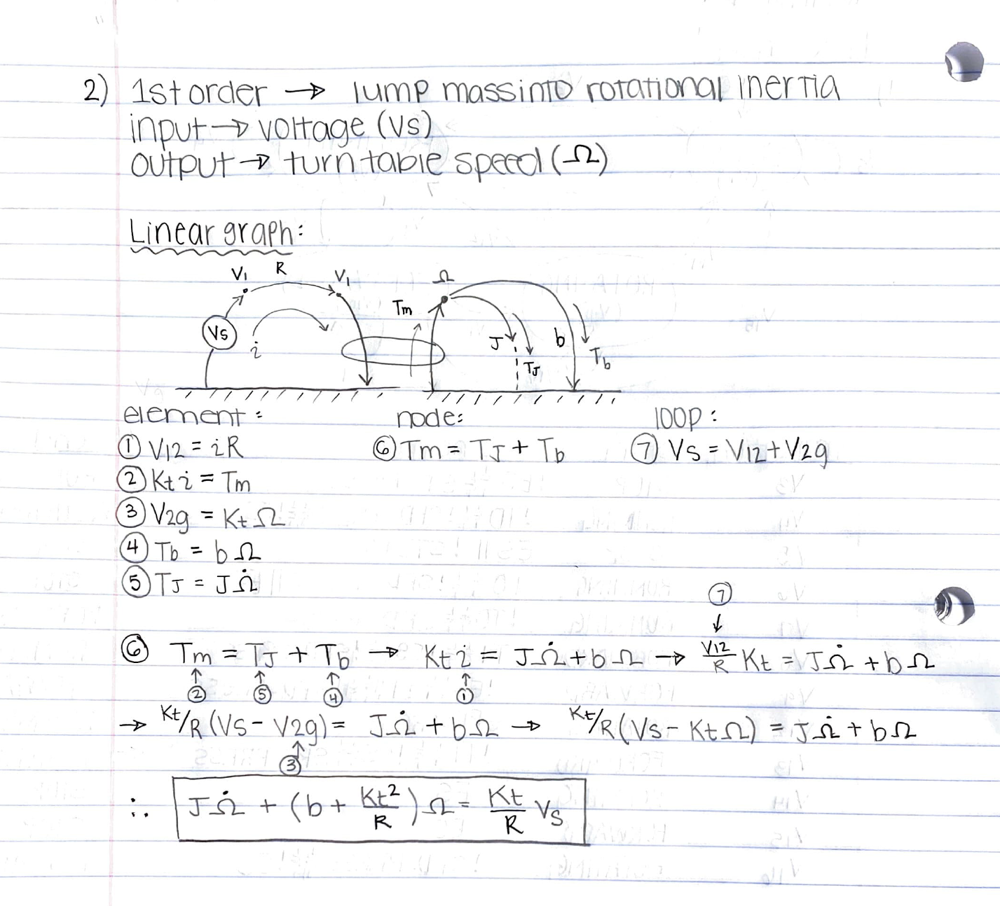

## Model Construction: Find a suitable value for the damping in the motor and bearings

Using the data and your model, determine a value for the combined damping in the turntable bearings and in the motor. You may use the code cell below to verify your fit, and/or load the data for manipulation if you like. You may also use approximate values extracted visually from the plots above if you prefer. Regardless of whether you use the code cell below, each step of your process must be explained and justified in the markdown cell below.

this is an empty cell, work is below...

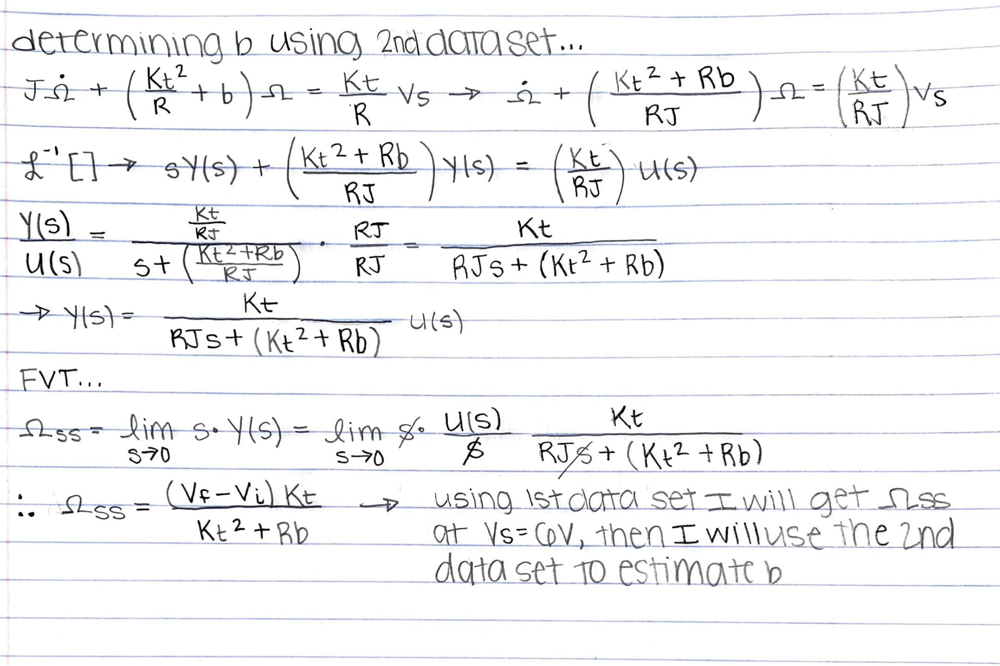

In [26]:
Kt = .8731;
R = 2.18;

data1 = load('step1data.txt');
t1 = data1(:,1);
omega1 = data1(:,3);
omega1ss = mean(omega1(end-50:end));
vs1 = data1(end,2);

data2 = load('step2data.txt');
t2 = data2(:,1);
omega2 = data2(:,3);
omega2ss = mean(omega2(end-50:end));
vs2 = data2(end,2);

b = ((vs2-vs1)*Kt - Kt^2*(omega2ss-omega1ss))/(R*(omega2ss-omega1ss))

b =  0.046629


## Model Evaluation

Looking at the two datasets above, what reservations (if any) do you have about your model's ability to generalize to other voltage inputs and/or initial values? Use concrete concepts and specific language to answer this question. Address linearity, stability, and transient behavior of the system in each test. You may use code cell below if you wish to support your argument with a plot, but it is not required. Whether you use code or not, make your arguments in the markdown cell below.

The model is BIBO stable and accurrately predicts the behavior of the turntable from the two data sets (as can be seen in the figures below). The data and model appear linear (it seems to be almost a 1:1 correlation of input voltage to output angular velocity). The settling times of both data sets are also very similar if not the same. The only concern is that the data becomes more noisy and varies when given larger input voltages and thus it can be hard to pin point the exact steady state angular velocity of the turntable.

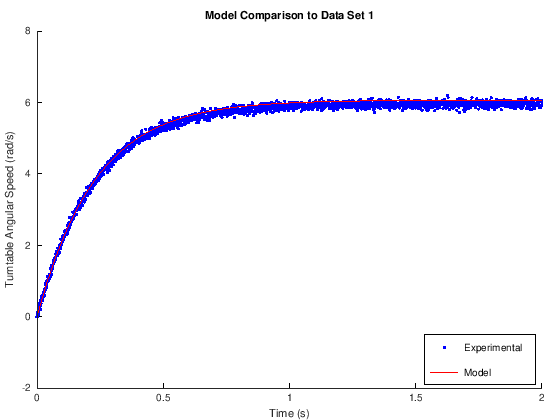

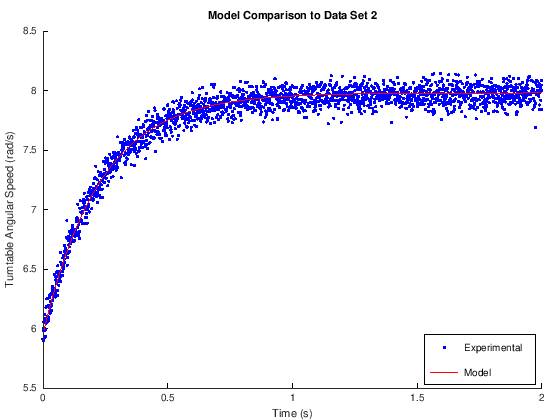

In [30]:
% calculate lumped J 
m = 2;
r = 0.3;
J_mass = 0.5*m*r^2;
J_m = 1.0E-3;
J = J_mass+J_m;

% using TF I am going to simulate the second data set (6V-->8V)
s = tf('s');
TF = Kt/((R*J)*s + (Kt^2 + R*b));
[ysim,tsim]=step(TF,2);
y_model = ((vs2-vs1)*ysim)+omega1ss;

% plotting model prediction against actual data
figure(1)
hold on
plot(t2,omega2,'b.')
plot(tsim,y_model,'r')
legend('Experimental','Model','location','southeast')
xlabel('Time (s)')
ylabel('Turntable Angular Speed (rad/s)')
title('Model Comparison to Data Set 2')
hold off

%plotting model against first data set
y_model1 = (vs1*ysim);
figure(2)
hold on
plot(t1,omega1,'b.')
plot(tsim,y_model1,'r')
legend('Experimental','Model','location','southeast')
xlabel('Time (s)')
ylabel('Turntable Angular Speed (rad/s)')
title('Model Comparison to Data Set 1')
hold off

# Problem 3

In order to make the spirograph work well and produce high-quality patterns, the turntable's speed must be controlled precisely. Despite the varying friction that results from the pen's contact with the turntable (which we have not modeled and do not wish to model!), the turntable must maintain the desired speed. Your experience designing other machines of this type has led you to the following design specifications for a controller on turntable speed:

1. The controller must produce zero steady state error in response to a requested angular velocity.
2. A sudden change in the requested turntable speed should result in a response that settles to steady state within 0.5 seconds.
3. Approximately 5 percent overshoot in turntable speed when responding to a step change in desired speed is acceptable.


## Controller Design

Design a P, PI, or PID feedback controller (as appropriate) that meets the design specifications above. Present your hand calculations in the markdown cell below.

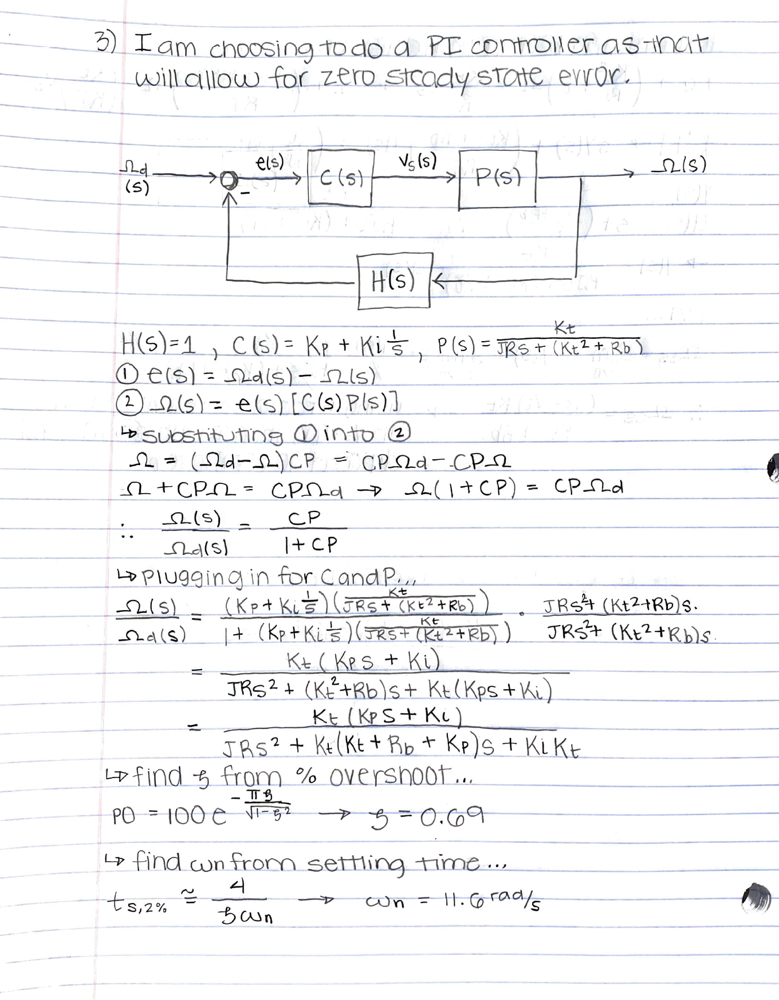

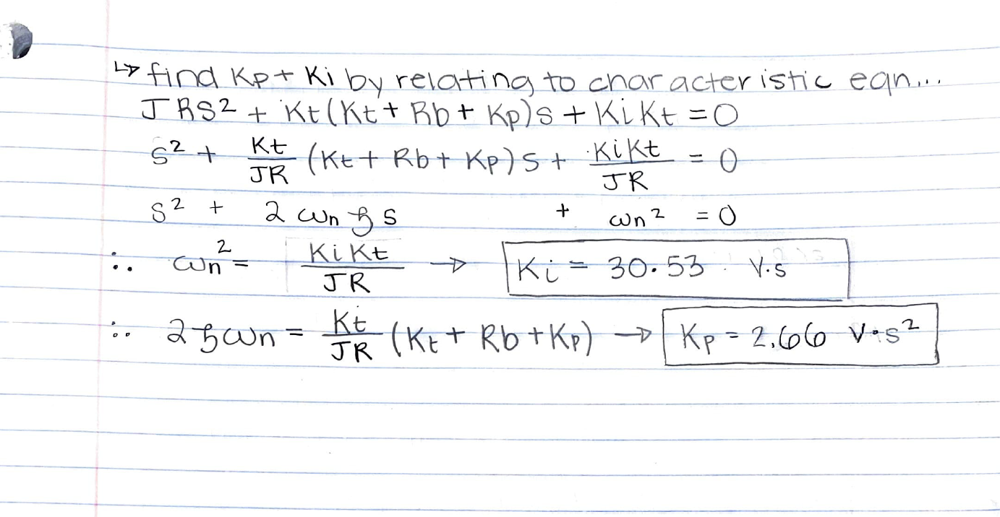

## Controller Validation

You do not have the ability to test your controller (not even in the FSM simulator- it is not set up for this). However, you can generate a simulation of your model's behavior to evaluate how the predicted system performance compares to the design intent. Present a simulation in the code cell below of a **closed loop** step response test in which the turntable begins spinning at 6 rad/s at steady state, and then a step increase of 2 rad/s is requested by the user. 

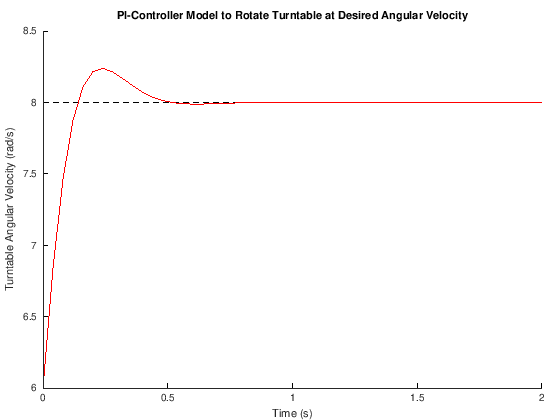

In [34]:
%Set up parameters of the model
Ki = 30.5338;
Kp = 2.6606;
omegabar = 6;
stepmag = 2;

% P Controller Model...
s = tf('s');
P = Kt/((R*J)*s + (Kt^2 + R*b));
C = Kp + (1/s)*Ki;
Gcl = P*C/(1+P*C);

[ysim,tsim]=step(Gcl,2);
ysim= (stepmag*ysim)+omegabar;

% plotting...
figure
hold on
plot(tsim,ones(length(tsim))*8,'k--')
plot(tsim,ysim,'r')
xlabel('Time (s)')
ylabel('Turntable Angular Velocity (rad/s)')
title('PI-Controller Model to Rotate Turntable at Desired Angular Velocity')
hold off

## Controller Evaluation

Using concrete language and specific course concepts, along with any calculations you feel help make your case, explain how you think your controller design would perform if you *did not change* your control gains, but the mass of the turntable was doubled. Cast your answer in terms of the characteristics you'd expect to see in the closed-loop response.

When the mass of the turn table is doubled, the PI controller design does oscillate more, as well as the percent overshoot and settling time are slightly above the limited values (PO = 5.86% and ts = 0.52 seconds). In order for the controller to not exceed the limit for percent overshoot and settling time, the values of Ki and Kp would need to be effectively doubled. Even though the controller does not meet the criteria on settling time and percent overshoot under this new condition, there is still no steady state error and the closed-loop response will always meet the desired turntable angular velocity. In order to meet all the criteria when the mass of the turn table is doubled I would have allowed for more wiggle room with the settling time and percent overshoot so that the Ki and Kp values I determined were more applicable to other conditions. 

J_new =  0.18100
ts =  0.52000
PO =  5.8611


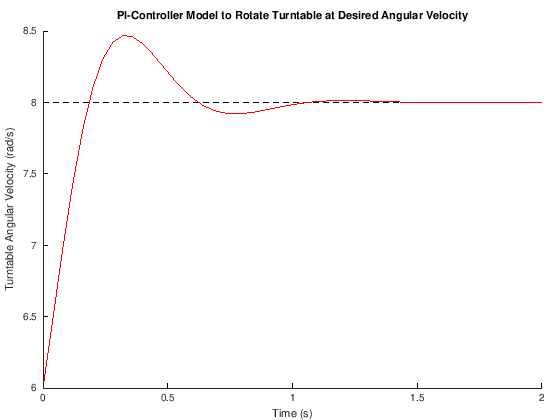

In [42]:
J_new = 2*J_mass+J_m

P_new = Kt/((R*J_new)*s + (Kt^2 + R*b));
Gcl_new = P_new*C/(1+P_new*C);

[ymodel,tmodel]=step(Gcl_new,2);
ymodel= (stepmag*ymodel)+omegabar;

% plotting...
figure
hold on
plot(tmodel,ones(length(tmodel))*8,'k--')
plot(tmodel,ymodel,'r')
xlabel('Time (s)')
ylabel('Turntable Angular Velocity (rad/s)')
title('PI-Controller Model to Rotate Turntable at Desired Angular Velocity')
hold off

% finding settling time
for j = length(ymodel)-1:-1:1 % starting from last data point and iterating backwards
    y_diff = abs((8-ymodel(j))/8)*100; % calculating percent difference
    if y_diff > 2 % checking if greater than 2%
        break; % stopping for loop if above 2%
    end
end
ts = tmodel(j)

% finding % overshoot
ymax = max(ymodel);
PO = ((ymax-8)/8)*100